# **Package Requirements**

In [88]:
import branca.colormap as cm
import folium
import h3
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score,recall_score, precision_score, average_precision_score, classification_report

# Suppress all warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_columns', 200)

In [4]:
df = pd.read_csv(final_telco.csv)

Lets look at the first 10 records from the dataframe.

In [5]:
df.head(10)

,Customer ID,Month,Month of Joining,zip_code,Gender,Age,Married,Dependents,Number of Dependents,Location ID,Service ID,state,county,timezone,area_codes,country,latitude,longitude,roam_ic,roam_og,loc_og_t2t,loc_og_t2m,loc_og_t2f,loc_og_t2c,std_og_t2t,std_og_t2m,std_og_t2f,std_og_t2c,isd_og,spl_og,og_others,loc_ic_t2t,loc_ic_t2m,loc_ic_t2f,std_ic_t2t,std_ic_t2m,std_ic_t2f,std_ic_t2o,spl_ic,isd_ic,ic_others,total_rech_amt,total_rech_data,vol_4g,vol_5g,arpu_5g,arpu_4g,arpu,night_pck_user,fb_user,aug_vbc_5g,offer,Referred a Friend,Number of Referrals,Phone Service,Multiple Lines,Internet Service,Internet Type,Streaming Data Consumption,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Payment Method,Status ID,Satisfaction Score,Churn Category,Churn Reason,Customer Status,Churn Value
0,hthjctifkiudi0,1,1,71638,Female,36.000000,No,No,0.0,jeavwsrtakgq0,bfbrnsqreveeuafgps0,AR,Chicot County,America/Chicago,870,US,33.52,-91.43,18.88,78.59,280.32,30.970000,5.71,1.79,25.71,175.56,0.47000,0,5.11,0.65,13.99,121.51,168.40,67.61,115.69,52.22,18.71,0,0.26,11.53,46.42,18,NaN,38.30,219.25,Not Applicable,Not Applicable,273.07,NaN,NaN,214.99,A,Yes,9.0,Yes,Yes,Yes,DSL,27,No,No,Yes,Yes,No,Yes,Yes,Yes,Credit Card,vvhwtmkbxtvsppd52013,3,Competitor,Competitor offered higher download speeds,Churned,1
1,uqdtniwvxqzeu1,6,6,72566,Male,36.472065,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,69.46,72.08,255.73,148.800000,30.00,7.61,308.29,265.20,10.82000,0,1.23,905.51,1.69,212.93,155.19,29.04,9.15,38.89,0.84,0,0.05,32.51,25.53,1183,0.0,0.00,0.00,0,0,-329.96,0.0,1.0,0.00,F,No,0.0,Yes,Yes,No,NaN,14,No,Yes,No,No,Yes,No,No,No,Bank Withdrawal,jucxaluihiluj82863,4,Not Applicable,Not Applicable,Stayed,0
2,uqdtniwvxqzeu1,7,6,72566,Male,36.442687,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,1012.60,115.26,52.95,1152.484282,103.28,15.71,244.20,15.19,61.84549,0,13.14,455.15,115.63,121.80,699.39,44.49,83.59,914.70,13.25,0,0.06,13.05,5.62,295,7.0,14.83,967.95,-9.4,106.3,101.22,1.0,1.0,85.87,No Offer,Yes,6.0,Yes,No,Yes,Cable,82,No,No,Yes,No,Yes,No,No,Yes,Credit Card,vjskkxphumfai57182,3,Not Applicable,Not Applicable,Stayed,0
3,uqdtniwvxqzeu1,8,6,72566,Male,36.837888,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,84.18,99.85,140.51,4006.990000,280.86,6.33,346.14,103.15,183.53000,0,33.88,495.60,14.01,658.96,195.02,144.11,50.18,2.35,623.94,0,0.07,69.13,10.62,354,1.0,264.90,268.11,-5.15,77.53,215.48,0.0,1.0,268.38,J,Yes,10.0,Yes,No,Yes,Fiber Optic,57,No,No,Yes,No,Yes,No,No,Yes,Wallet Balance,cdwbcrvylqca53109,4,Not Applicable,Not Applicable,Stayed,0
4,uqdtniwvxqzeu1,9,6,72566,Male,36.490214,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00000,0,0.00,0.00,0.00,138.85,201.92,19.89,15.91,23.78,16.01,0,0.03,64.35,36.18,0,NaN,52.78,370.59,Not Applicable,Not Applicable,636.55,NaN,NaN,399.84,No Offer,Yes,1.0,No,No,Yes,Fiber Optic,38,No,No,No,No,No,Yes,No,Yes,Credit Card,whqrmeulitfj98550,1,Not Applicable,Not Applicable,Stayed,0
5,uqdtniwvxqzeu1,10,6,72566,Male,36.420839,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,775.76,81.54,67.47,78.410000,6.75,6.97,193.49,215.74,0.18000,0,12.88,33.07,11.55,156.69,128.45,73.36,6.84,16.09,25.74,0,0.08,61.54,63.21,700,0.0,0.00,0.00,789,0,771.79,0.0,1.0,0.00,No Offer,Yes,10.0,Yes,Yes,No,NaN,21,No,No,No,Yes,Yes,Yes,Yes,NaN,Bank Withdrawal,adzabvpghmbju72072,4,Not Applicable,Not Applicable,Stayed,0
6,uqdtniwvxqzeu1,11,6,72566,Male,36.566777,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,61.23,75.63,281.94,1691.320000,48.84,6.50,304.78,186.81,171.10000,0,38.18,23.13,13.57,50.28,23.20,11.44,14.58,60.26,20.67,0,0.04,40.03,65.16,153,0

In [6]:
df.shape

(653753, 74)

# **Exploratory Data Analysis**

In [8]:
# Check the Information of the Dataframe, number of unique values and frequency
df.describe()

,Month,Month of Joining,zip_code,Age,Number of Dependents,latitude,longitude,roam_ic,roam_og,loc_og_t2t,loc_og_t2m,loc_og_t2f,loc_og_t2c,std_og_t2t,std_og_t2m,std_og_t2f,std_og_t2c,isd_og,spl_og,og_others,loc_ic_t2t,loc_ic_t2m,loc_ic_t2f,std_ic_t2t,std_ic_t2m,std_ic_t2f,std_ic_t2o,spl_ic,isd_ic,ic_others,total_rech_amt,total_rech_data,vol_4g,vol_5g,arpu,night_pck_user,fb_user,aug_vbc_5g,Number of Referrals,Streaming Data Consumption,Satisfaction Score,Churn Value
count,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.0,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.0,653753.000000,653753.000000,653753.000000,653753.000000,443849.000000,653753.000000,653753.000000,653753.000000,280650.000000,243359.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000
mean,9.508209,5.823574,90386.180128,36.627306,1.161315,37.652731,-114.392353,249.650062,267.554526,834.627907,678.555093,32.269235,30.328622,577.609175,441.073443,34.878531,0.0,49.607952,88.964193,98.301149,846.741273,720.747069,330.918680,369.433263,306.379408,125.712469,0.0,0.251306,251.280851,144.004213,1687.052445,4.852747,192.096023,7967.055649,781.196280,0.217638,0.795796,530.525621,4.337965,27.574284,3.131712,0.045682
std,3.298742,2.855148,8412.506653,12.168730,2.245762,4.687151,10.537540,424.617016,625.610117,1589.595058,1112.490535,59.016877,67.610983,1306.899719,990.214161,57.920941,0.0,113.245522,168.699998,161.822511,1216.215767,1009.686119,483.251341,631.201630,437.613149,185.826000,0.0,0.438407,442.322772,293.132705,2980.015423,8.319981,592.101187,36093.904463,1807.269437,0.412640,0.403120,1402.826168,3.768386,26.349552,1.249076,0.208796
min,1.000000,1.000000,71601.000000,19.000000,0.000000,31.790000,-124.630000,-25.506563,-109.250816,-31.570579,0.000000,-6.975713,0.000000,0.000000,0.000000,-2.193700,0.0,0.000000,-42.425137,-12.746303,0.000000,0.000000,0.000000,-41.100527,0.000000,0.000000,0.0,0.000000,-49.675211,-58.302931,0.000000,0.000000,0.000000,0.000000,-2258.680000,0.000000,0.000000,-374.893876,0.000000,0.000000,1.000000,0.000000
25%,7.000000,3.000000,88424.000000,28.000000,0.000000,34.140000,-121.650000,12.090000,14.710000,32.700000,26.260000,1.460000,1.610000,33.120000,25.560000,1.200000,0.0,3.250000,4.940000,3.430000,85.570000,84.170000,36.110000,42.460000,32.190000,12.460000,0.0,0.040000,26.980000,20.330000,72.000000,0.000000,0.000000,0.000000,118.940000,0.000000,1.000000,0.000000,0.000000,2.000000,3.000000,0.000000
50%,10.000000,6.000000,93032.000000,34.000000,0.000000,36.080000,-118.390000,50.560000,75.100000,171.330000,135.460000,7.800000,8.180000,174.600000,134.800000,6.340000,0.0,17.190000,25.580000,17.830000,171.490000,168.390000,72.060000,84.470000,64.760000,24.980000,0.0,0.080000,53.700000,40.540000,374.000000,0.000000,47.010000,362.380000,348.540000,0.000000,1.000000,117.320000,4.000000,20.000000,3.000000,0.000000
75%,12.000000,8.000000,95551.000000,43.000000,1.000000,38.600000,-108.800000,162.030000,135.280000,309.090000,618.210000,14.090000,14.700000,316.240000,244.490000,36.640000,0.0,31.140000,46.190000,106.790000,1259.270000,1090.065814,496.790000,126.270000,448.830000,186.710000,0.0,0.210000,80.370000,60.730000,1089.000000,7.000000,154.900000,964.720000,580.650000,0.000000,1.000000,311.750000,8.000000,49.000000,4.000000,0.000000
max,14.000000,12.000000,99403.000000,80.000000,9.000000,48.990000,-89.740000,1719.430000,3161.780000,6431.250000,4212.010000,283.530000,336.130000,7366.160000,5622.540000,217.440000,0.0,765.050000,1020.710000,609.800000,4363.950000,3847.169616,1872.340000,2527.070000,1619.680000,663.930000,0.0,2.330000,1917.369911,1344.130000,11900.000000,32.000000,4503.930000,254687.000000,9394.500000,1.000000,1.000000,8214.870000,11.000000,85.000

In [9]:
# Check the Information of the Dataframe, datatypes and non-null counts
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 653753 entries, 0 to 653752
Data columns (total 74 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Customer ID                 653753 non-null  object 
 1   Month                       653753 non-null  int64  
 2   Month of Joining            653753 non-null  int64  
 3   zip_code                    653753 non-null  int64  
 4   Gender                      653753 non-null  object 
 5   Age                         653753 non-null  float64
 6   Married                     653753 non-null  object 
 7   Dependents                  653753 non-null  object 
 8   Number of Dependents        653753 non-null  float64
 9   Location ID                 653753 non-null  object 
 10  Service ID                  653753 non-null  object 
 11  state                       653753 non-null  object 
 12  county                      653753 non-null  object 
 13  timezone      

In [10]:
df['Customer Status'].value_counts()

Customer Status
Stayed     623888
Churned     29865
Name: count, dtype: int64

**Observation:** 
* Not Applicable refers to cases where customer didn't churn
* There are garbage values present in churn reason

Considering customers who have Moved or Deceased

In [12]:
df['Churn Category'].value_counts()

Churn Category
Not Applicable     622748
Support              7538
Dissatisfaction      6001
Competitor           5974
Price                4381
Other                4356
Unknown              1269
bcvjhdjcb            1190
Attitude              296
Name: count, dtype: int64

In [13]:
df['Customer ID'].value_counts()

Customer ID
fsibrinqnxrwb88715     14
xrkosczoamoko85346     14
uamxcmivltbpf25828     14
ncrwtyxyfwaqt124282    14
fwjnloadbmejj33187     14
                       ..
cfgksoobasqod130000     1
orrsrrpyagrbb130005     1
qnqxajmzpnyba20178      1
kwgmrhfxoewjt152177     1
hthjctifkiudi0          1
Name: count, Length: 98230, dtype: int64

### EDA using plots

Our goal is to build a customer churn model. Therefore, we need to understand what factors have the greatest impact on the churn of customers from the service first.
Introducing a new metric - the churn rate (the percentage of customers who churned), and look at this metric in terms of the characteristics of the customers that we have.

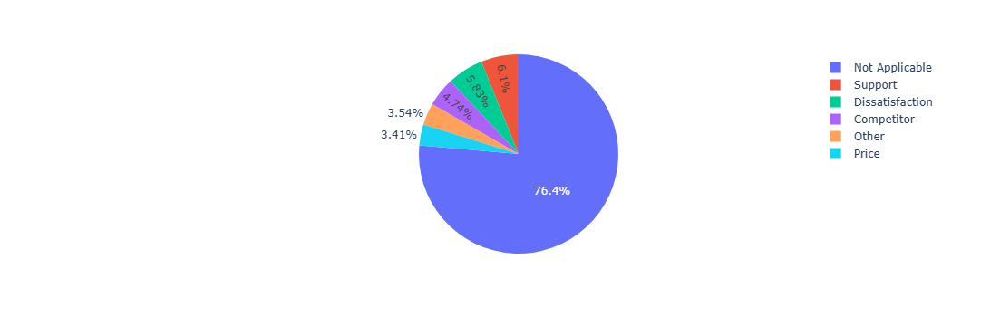

In [18]:
fig = px.pie(df.groupby('Churn Category')['Customer ID'].nunique().reset_index(), 
             values='Customer ID', 
             names='Churn Category')
fig.show()

In [21]:
df.groupby(['country','state'])['Customer ID'].nunique()

country  state
US       AR       15415
         CA       57222
         NM        9133
         WA       15727
Name: Customer ID, dtype: int64

In [22]:
df.drop("country", inplace=True, axis=1)

In [23]:
df.groupby(['timezone'])['Customer ID'].nunique()

timezone
America/Chicago        15415
America/Denver          9133
America/Los_Angeles    72949
Name: Customer ID, dtype: int64

In [24]:
df.drop("timezone", inplace=True, axis=1)

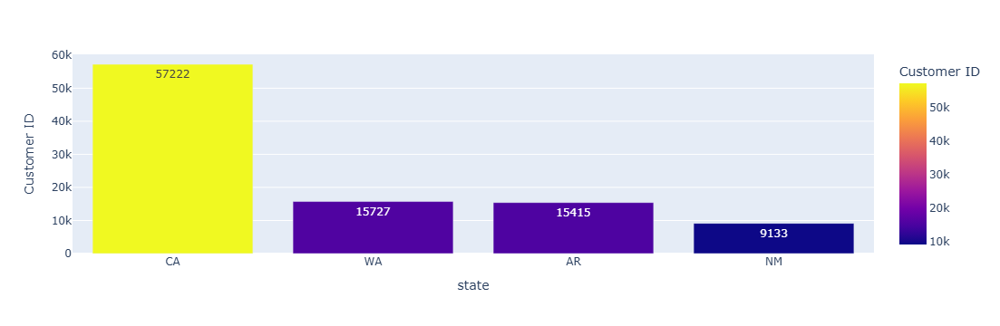

In [25]:
fig = px.bar(df.groupby(['state'])['Customer ID'].nunique().reset_index().sort_values('Customer ID',
                                                                                    ascending=False).head(50),
             x='state',
             y='Customer ID', 
             color = 'Customer ID',
             text = 'Customer ID')
fig.show()

#### Let's look at the churn rate for every hexagon

In [27]:
churn = df.assign(churn_clients = np.where(df['Churn Value']==1, df['Customer ID'],None))\
            .groupby(['hex_id']).agg({'churn_clients':'count'}).reset_index()
clients = df.groupby(['hex_id'])['Customer ID'].count().reset_index()
churn_data = clients.join(churn.set_index(['hex_id']), on=['hex_id'])

churn_data['churn_rate'] = churn_data['churn_clients']/churn_data['Customer ID']

In [28]:
churn_data

,hex_id,Customer ID,churn_clients,churn_rate
0,8512d803fffffff,211,3,0.014218
1,8512d807fffffff,138,5,0.036232
2,8512d83bfffffff,242,4,0.016529
3,8512d843fffffff,315,11,0.034921
4,8512d847fffffff,132,5,0.037879
...,...,...,...,...
1789,8548de4ffffffff,170,4,0.023529
1790,8548de77fffffff,127,5,0.039370
1791,8548de8ffffffff,110,2,0.018182
1792,8548debbfffffff,85,9,0.105882


In [31]:
df['Tenure Months'] = df['Month'] - df['Month of Joining']

In [33]:
df.groupby('Churn Value')['Tenure Months'].quantile([.50,.75,.90,.95])

Churn Value      
0            0.50     3.0
             0.75     6.0
             0.90     8.0
             0.95    10.0
1            0.50     2.0
             0.75     5.0
             0.90     7.0
             0.95     8.0
Name: Tenure Months, dtype: float64

In [34]:
df.groupby('Churn Value')['Tenure Months'].mean()

Churn Value
0    3.723440
1    2.883074
Name: Tenure Months, dtype: float64

We know that in general 25.4% of customers have stopped using our service and 50% of such customers have used our service for 2 months or less.

Now we can start analyzing our customer profile data to understand which type of customers are more likely to stop using our service and what actions we can take.

But before that, we can also look at the customer responses that we have in the Churn Reason column. Of course, customer survey data is often biased, as it contains the subjective opinion of the customer, but asking the opinion of customers is very important for any business that wants to develop and improve. Moreover, we have a lot of information with which we can verify customer responses.

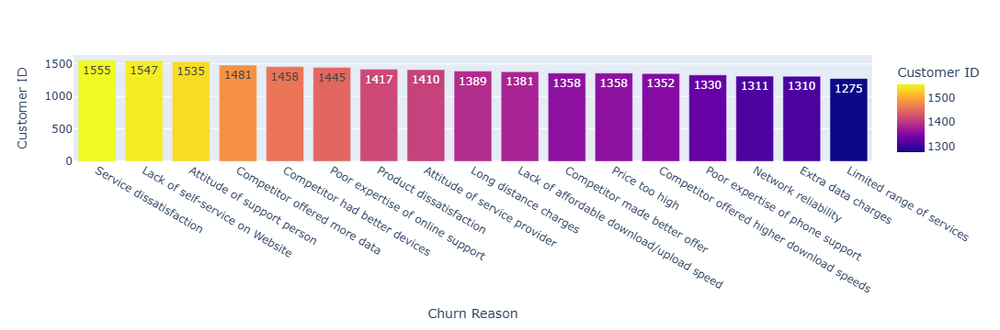

In [35]:
fig = px.bar(df[~df['Churn Reason'].isin(['Not Applicable', 'Unknown', '43tgeh'])]\
             .groupby(['Churn Reason'])['Customer ID'].nunique().reset_index()\
             .sort_values('Customer ID',ascending=False),
             x='Churn Reason',
             y='Customer ID', 
             color = 'Customer ID',
             text = 'Customer ID')
fig.show()

**Observation**
* 6.2% of churn customers left the service due to service dissatisfaction
* Another 6.1% of churn customers left the service due to Lack of self-service on Website
* We also have a number of reasons for the churn that we cannot understand in any way

### Total and monthly charges of clients

Let's look at the total and data chargers of customers

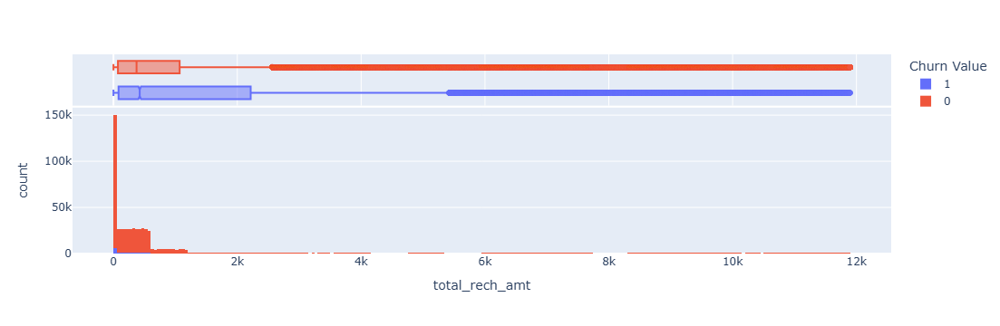

In [36]:
fig = px.histogram(df, x="total_rech_amt", color="Churn Value",
                   marginal="box")
fig.show()

**Observation**
* The median charges of customers who have gone into churn are higher than the median charges of customers who use the service
* But this does not necessarily mean that customers who stopped using the service were more affluent. After all, we have already learned that many customers leave the service in the first 2 months of using the service

## Boxplot

In [37]:
df.groupby('Churn Value')['aug_vbc_5g'].quantile([.50,.75,.95,.99])

Churn Value      
0            0.50     117.0500
             0.75     311.1800
             0.95    3768.1380
             0.99    7360.0096
1            0.50     121.6500
             0.75     324.9600
             0.95    4813.1580
             0.99    7477.9488
Name: aug_vbc_5g, dtype: float64

**Observation**
* 5G usage isn't influencing churn directly
* we drop the column

In [38]:
df.drop(['aug_vbc_5g'], axis=1, inplace=True)

In [39]:
corr_df = df.copy()

In [40]:
df_dummies = pd.get_dummies(corr_df[['Churn Value','Phone Service','Multiple Lines','Internet Service','Online Security',
                                 'Online Backup','Device Protection Plan','Premium Tech Support','Streaming TV',
                                 'Streaming Movies', 'Streaming Music', 'Unlimited Data']])
df_dummies.head()

,Churn Value,Phone Service_No,Phone Service_Yes,Multiple Lines_No,Multiple Lines_Yes,Internet Service_No,Internet Service_Yes,Online Security_No,Online Security_Yes,Online Backup_No,Online Backup_Yes,Device Protection Plan_No,Device Protection Plan_Yes,Premium Tech Support_No,Premium Tech Support_Yes,Streaming TV_No,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_Yes,Streaming Music_No,Streaming Music_Yes,Unlimited Data_No,Unlimited Data_Yes
0,1,False,True,False,True,False,True,True,False,True,False,False,True,False,True,True,False,False,True,False,True,False,True
1,0,False,True,False,True,True,False,True,False,False,True,True,False,True,False,False,True,True,False,True,False,True,False
2,0,False,True,True,False,False,True,True,False,True,False,False,True,True,False,False,True,True,False,True,False,False,True
3,0,False,True,True,False,False,True,True,False,True,False,False,True,True,False,False,True,True,False,True,False,False,True
4,0,True,False,True,False,False,True,True,False,True,False,True,False,True,False,True,False,False,True,True,False,False,True


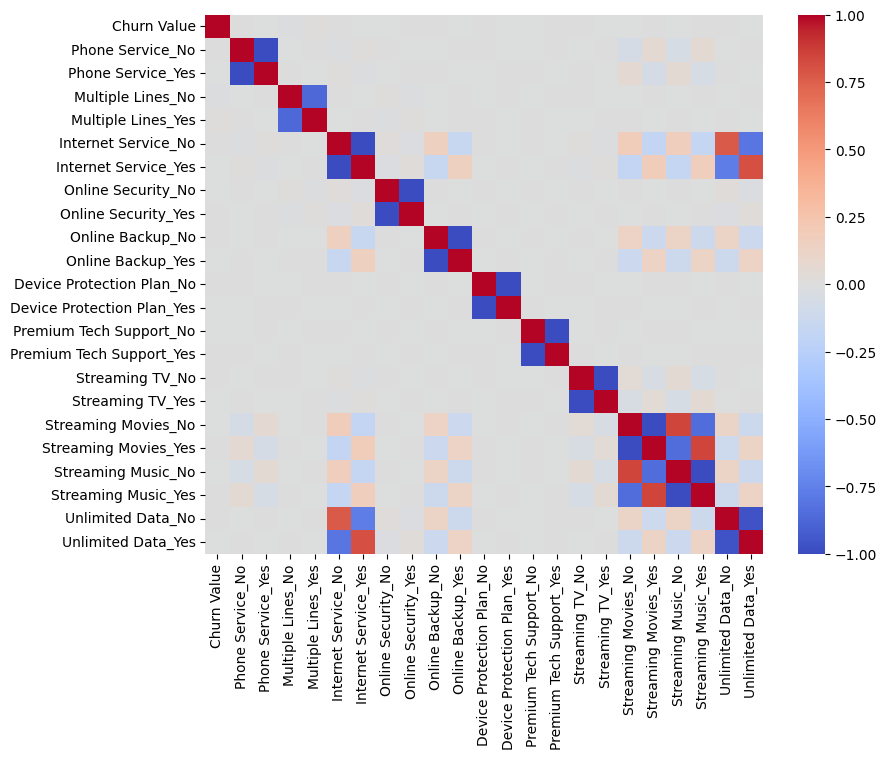

In [41]:
plt.figure(figsize=(9, 7))
sns.heatmap(df_dummies.corr(), annot=False, cmap='coolwarm')

plt.show()

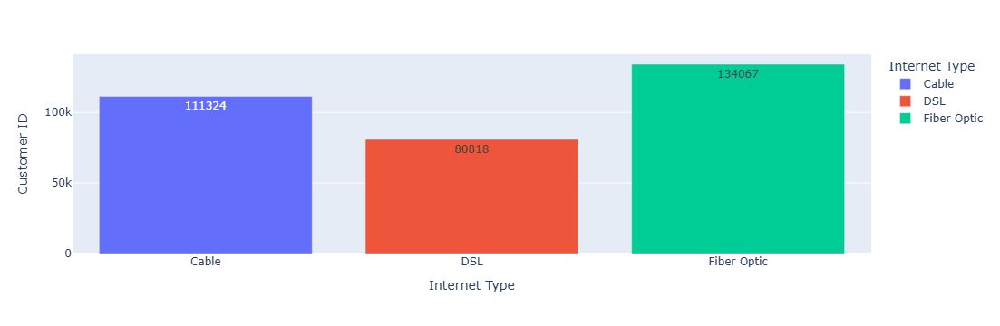

In [43]:
fig = px.bar(df.groupby('Internet Type')['Customer ID'].count().reset_index(),
             x='Internet Type',
             y='Customer ID', 
             color = 'Internet Type',
             text = 'Customer ID')
fig.show()

**Observation**

Most of the clients are connected to the fiber optic internet. We also see a group of customers who do not use Internet services (most likely use only phone services), and apparently the churn rate among such customers is lower (according to the correlation graph, but we will check this later).

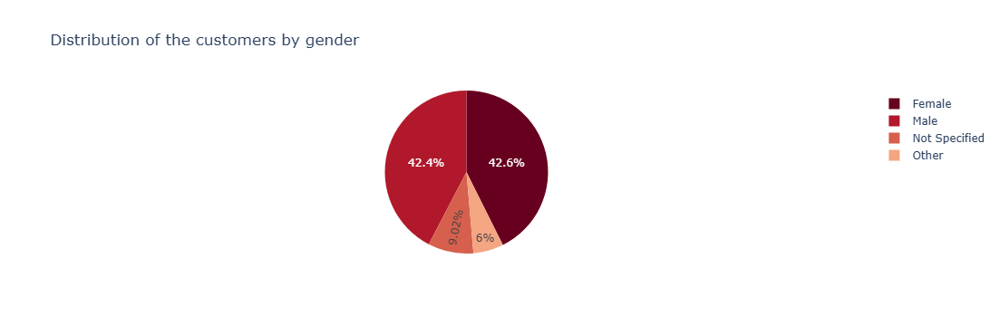

In [44]:
fig = px.pie(df.groupby('Gender')['Customer ID'].count().reset_index(), 
            values='Customer ID', 
            names='Gender',
            color_discrete_sequence=px.colors.sequential.RdBu,
            title = 'Distribution of the customers by gender')

fig.show()



We have an almost equal number of men and women in the data set. Let's see if there is a difference in the churn rate:

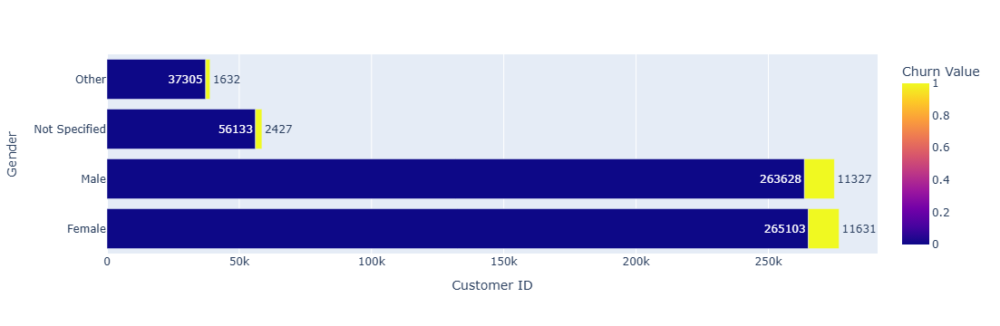

In [45]:
fig = px.bar(df.groupby(['Gender','Churn Value'])['Customer ID'].count().reset_index(),
             x="Customer ID",
             y="Gender", 
             color="Churn Value", 
             text = 'Customer ID'
            )
fig.show()

**Observation**
* We don't see much difference

# **Data Processing & Feature engineering**

In [46]:
data = df.copy()

## Drop ID columns

In [47]:
data = data.drop(["Location ID", "Service ID", "area_codes", "Status ID"], axis=1)

In [48]:
data = data.drop(['Customer ID','zip_code','state','county','latitude','longitude', 
                  'night_pck_user', 'fb_user', 'Customer Status'], axis = 1)

We will treat the missing values now although they are present in very few columns

In [50]:
data['Internet Type'].value_counts()

Internet Type
Fiber Optic    134067
Cable          111324
DSL             80818
Name: count, dtype: int64

In [51]:
data['Internet Type'].fillna("Other", inplace=True)
data['total_rech_data'].fillna(data['total_rech_data'].mean(), inplace=True)

### Label Encoding

In [52]:
def encode_data(dataframe_series):
    if dataframe_series.dtype=='object':
        dataframe_series = LabelEncoder().fit_transform(dataframe_series)
    return dataframe_series

In [53]:
data = data.apply(lambda x: encode_data(x))
data.head()

,Month,Month of Joining,Gender,Age,Married,Dependents,Number of Dependents,roam_ic,roam_og,loc_og_t2t,loc_og_t2m,loc_og_t2f,loc_og_t2c,std_og_t2t,std_og_t2m,std_og_t2f,std_og_t2c,isd_og,spl_og,og_others,loc_ic_t2t,loc_ic_t2m,loc_ic_t2f,std_ic_t2t,std_ic_t2m,std_ic_t2f,std_ic_t2o,spl_ic,isd_ic,ic_others,total_rech_amt,total_rech_data,vol_4g,vol_5g,arpu_5g,arpu_4g,arpu,offer,Referred a Friend,Number of Referrals,Phone Service,Multiple Lines,Internet Service,Internet Type,Streaming Data Consumption,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Payment Method,Satisfaction Score,Churn Category,Churn Reason,Churn Value,hex_id,Tenure Months
0,1,1,0,36.000000,0,0,0.0,18.88,78.59,280.32,30.970000,5.71,1.79,25.71,175.56,0.47000,0,5.11,0.65,13.99,121.51,168.40,67.61,115.69,52.22,18.71,0,0.26,11.53,46.42,18,4.848785,38.30,219.25,121852,122333,273.07,0,1,9.0,1,1,1,1,27,0,0,1,1,0,1,1,1,1,3,0,4,1,1537,0
1,6,6,1,36.472065,0,0,0.0,69.46,72.08,255.73,148.800000,30.00,7.61,308.29,265.20,10.82000,0,1.23,905.51,1.69,212.93,155.19,29.04,9.15,38.89,0.84,0,0.05,32.51,25.53,1183,0.000000,0.00,0.00,1608,1008,-329.96,5,0,0.0,1,1,0,3,14,0,1,0,0,1,0,0,0,0,4,2,12,0,236,0
2,7,6,1,36.442687,0,0,0.0,1012.60,115.26,52.95,1152.484282,103.28,15.71,244.20,15.19,61.84549,0,13.14,455.15,115.63,121.80,699.39,44.49,83.59,914.70,13.25,0,0.06,13.05,5.62,295,7.000000,14.83,967.95,1550,3911,101.22,10,1,6.0,1,0,1,0,82,0,0,1,0,1,0,0,1,1,3,2,12,0,236,1
3,8,6,1,36.837888,0,0,0.0,84.18,99.85,140.51,4006.990000,280.86,6.33,346.14,103.15,183.53000,0,33.88,495.60,14.01,658.96,195.02,144.11,50.18,2.35,623.94,0,0.07,69.13,10.62,354,1.000000,264.90,268.11,1147,102478,215.48,9,1,10.0,1,0,1,2,57,0,0,1,0,1,0,0,1,2,4,2,12,0,236,2
4,9,6,1,36.490214,0,0,0.0,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00000,0,0.00,0.00,0.00,138.85,201.92,19.89,15.91,23.78,16.01,0,0.03,64.35,36.18,0,4.848785,52.78,370.59,121852,122333,636.55,10,1,1.0,0,0,1,2,38,0,0,0,0,0,1,0,1,1,1,2,12,0,236,3


### Let's look at correlation of our remaining variables with Churn Value

Correlation is a statistical measure that describes the strength and direction of the relationship between two variables. In other words, correlation measures how closely two variables are related to each other.

The correlation coefficient, typically denoted by "r", ranges from -1 to 1, with -1 indicating a perfect negative correlation, 0 indicating no correlation, and 1 indicating a perfect positive correlation. A perfect positive correlation means that as one variable increases, the other variable increases proportionally, while a perfect negative correlation means that as one variable increases, the other variable decreases proportionally.

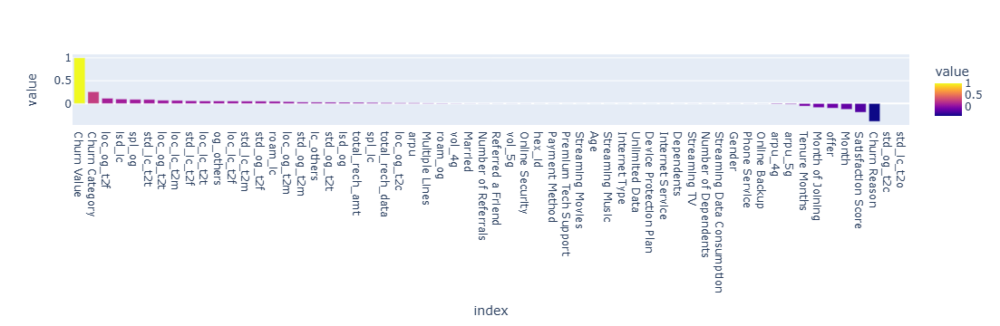

In [54]:
fig = px.bar(data.corr()['Churn Value'].sort_values(ascending = False),
             color = 'value')
fig.show()

In [55]:
data['Churn Value'].value_counts(normalize=1)

Churn Value
0    0.958383
1    0.041617
Name: proportion, dtype: float64

**Observation**
* We have a highly imbalanced dataset
* We should use over and under sampling to make our dataset more suited for the ML model

## SMOTE

**Applications**

SMOTE is commonly used in machine learning applications such as fraud detection, medical diagnosis, and anomaly detection, where the minority class is often of greater interest than the majority class.

## Undersampling

Undersampling can be effective in reducing the computational cost and training time of machine learning models, as well as reducing the risk of overfitting to the majority class.

**Applications**

Undersampling is commonly used in machine learning applications such as credit scoring, fraud detection, and medical diagnosis, where the minority class is often of greater interest than the majority class.

In [56]:
over = SMOTE(sampling_strategy=0.25)
under = RandomUnderSampler(sampling_strategy=0.7)

steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

x = data.drop("Churn Value", axis = 1)
y = data['Churn Value']

In [57]:
x, y = pipeline.fit_resample(x,y)

# **Model Building and Testing**

In [58]:
df_reason = x['Churn Reason']
y = x['Churn Category']
x = x.drop(['Churn Category', 'Churn Reason'], axis=1)

In [59]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state =2, test_size = 0.2)
print(x_train.shape, x_test.shape)

(302195, 57) (75549, 57)


**Splitting the dataset into a training and production dataset:**

- Training: Part of data used for training our supervised models
- Test: Part of the dataset used for testing our models performance

## 1. Multi-class classification to predict Churn Category

In [60]:
def model(method, x_train, y_train, x_test, y_test):
    # Train the model
    print("Training Model......")
    method.fit(x_train, y_train)
    print("Model Trained")
    
    # Make predictions on test data
    predictions = method.predict(x_test)
    
    # Evaluate model performance and print results
    print("Model accuracy: ", '{:.2%}'.format(accuracy_score(y_test, predictions)))
    print(classification_report(y_test, predictions))



In [61]:
rf = RandomForestClassifier(n_estimators = 200, max_depth = 20, n_jobs=-1)

In [62]:
model(rf, x_train, y_train, x_test, y_test)

Training Model......
Model Trained
Model accuracy:  74.81%
              precision    recall  f1-score   support

           0       0.68      0.47      0.56      6369
           1       0.51      0.44      0.47      6915
           2       0.78      0.97      0.87     47907
           3       0.69      0.26      0.38      5296
           4       0.63      0.38      0.47      5693
           5       0.87      0.16      0.27      3369

    accuracy                           0.75     75549
   macro avg       0.70      0.45      0.50     75549
weighted avg       0.74      0.75      0.71     75549



**Observation**
* Accuracy of our multi-class classification model is 74.7%

Solving our final problem and formulate the existing scenario into a multi-label classification

## 2. Multi-label classification to predict Churn Category and Churn Reason

In [63]:
from sklearn.preprocessing import MultiLabelBinarizer
# mlp for multi-label classification
from numpy import mean
from numpy import std
from sklearn.datasets import make_multilabel_classification
from sklearn.model_selection import RepeatedKFold
from keras.models import Sequential
from keras.layers import Dense
from keras.metrics import CategoricalAccuracy
from sklearn.metrics import accuracy_score

In [64]:
y = pd.DataFrame(y)
y['Churn Reason'] = df_reason
y.head()

,Churn Category,Churn Reason
0,2,12
1,2,12
2,2,12
3,2,12
4,2,12


In [65]:
mlb = MultiLabelBinarizer()
y_mlb = mlb.fit_transform(y.values)
x_mlb = x.values

For simplicity we would not transform discrete variable into one-hot and use them directly in the deep learning model

In [66]:
x_train, x_test, y_train, y_test = train_test_split(x_mlb, y_mlb, random_state =2, test_size = 0.2)
print(x_train.shape, x_test.shape)

(302195, 57) (75549, 57)


### Deep Neural Network a.k.a Multi-layer Perceptron

Keras is widely used in industry and academia for developing state-of-the-art deep learning models, and has been adopted by many companies including Google, Microsoft, and IBM. It has also been integrated into other machine learning libraries and frameworks such as TensorFlow 2.0, making it a popular choice for building deep learning models.

Categorical accuracy, also known as categorical accuracy score or simply accuracy, is a performance metric used to evaluate the performance of classification models. It measures the proportion of correctly classified samples out of the total number of samples in a dataset.


For example, suppose we have a dataset of 100 images, each of which belongs to one of five possible classes. A classification model is trained to predict the correct class label for each image. After evaluating the model on the test set, we find that it has correctly classified 80 of the images. The categorical accuracy of the model would then be 80/100 = 0.8, or 80%.

In [68]:
acc = model.evaluate(x_test, y_test, verbose=0)[1]*100.0
print('Categorical Accuracy: >%.3f' % acc)

Categorical Accuracy: >63.780


**Observation**
* Categorical accuracy of our model ins 63.4%

### **Considerations**

- Can we formulate this as a hierarchical classification problem?

## **Conclusion**

In this project we used a tree as well as deep learning models to predict a customer's churn category and the corresponding reason.

The problem could have been formulated as a hierarchical multi-level classification problem but we instead formulated this as a multi-label classification problem and the confidence on the predictions would enable the telecom company to chase the customers about to churn.


A successful data science project requires a clear understanding of the business problem and the data available, as well as the ability to select and apply appropriate data preprocessing techniques, feature engineering methods, and machine learning algorithms. It is also important to assess and optimize the performance of the model and communicate the results effectively to stakeholders.